In [1]:
import glob
import os

import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import seaborn as sns

sc.settings.verbosity = 3

In [2]:
# INPUT_DIR = "/n/groups/kirschner/Will/MetabolicObesity/sc"
INPUT_DIR = "inputs"

samples = {
    "BRI-1456": {
        "disease": "Healthy",
        "tissue": "SQ",
        "barcode_r": "_1",
        "sex": {
            "0": "F",
            "1": "F",
            "2": "F",
            "3": "M",
            "4": "M",
        }
    },
    "BRI-1457": {
        "disease": "Unhealthy",
        "tissue": "SQ",
        "barcode_r": "_2",
        "sex": {
            "0": "F",
            "1": "F",
            "2": "F",
            "3": "M",
            "4": "M",
        }
    },
    "BRI-1458": {
        "disease": "Healthy",
        "tissue": "Omentum",
        "barcode_r": "_1",
        "sex": {
            "0": "F",
            "1": "F",
            "2": "M",
            "3": "M",
            "4": "F",
        }
    },
    "BRI-1459": {
        "disease": "Unhealthy",
        "tissue": "Omentum",
        "barcode_r": "_2",
        "sex": {
            "0": "F",
            "1": "F",
            "2": "M",
            "3": "M",
            "4": "F",
        }
    },
}

In [3]:
clusterings = ["merge_samples",]  #["separate_samples", "intercept_samples", ]

for sample_name, sample in samples.items():
    
    sample["input_folder"] = os.path.join(INPUT_DIR, sample_name, "filtered_feature_bc_matrix")

    sample["cluster_fp"] = {
        clustering: os.path.join(INPUT_DIR, "demultiplex", clustering, sample_name, "clusters.tsv")  for clustering in clusterings
    }

In [4]:
for sample_name, sample in samples.items():
    
    adata = sc.read_10x_mtx(sample["input_folder"])
    sample["adata"] = adata

    for cluster_type, clusters_fp in sample["cluster_fp"].items():
        clusters = pd.read_csv(clusters_fp, sep="\t")
    
        cols = list(clusters.columns)
        cols.remove("barcode")
        
        # cols_cluster_type = [f"{col}_{cluster_type}" for col in cols]
        
        adata.obs[cols] = clusters.set_index("barcode").loc[adata.obs_names, cols]

    adata.obs[["sample_name", "disease", "tissue"]] = sample_name, sample["disease"], sample["tissue"]
    # adata.obs["sample"] = "SQ_MHO"

    # adata.obs["barcode_r"] = adata.obs_names.to_series() + sample["barcode_r"]

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


In [5]:
omentum_dict = {"adatas": [], "sample_name": [], "cohort": []}
sq_dict = {"adatas": [], "sample_name": [], "cohort": []}

for sample_name, sample in samples.items():
    if sample["tissue"] == "SQ":
        _dict = sq_dict
    elif sample["tissue"] == "Omentum":
        _dict = omentum_dict
    else:
        raise
        
    _dict["adatas"].append(sample["adata"])
    _dict["sample_name"].append(sample_name)
    _dict["cohort"].append(sample["disease"])

In [6]:
import anndata as ad


# omentum = ad.concat(omentum_dict["adatas"], label="cohort", keys=omentum_dict["cohort"], index_unique="_")
sq = ad.concat(sq_dict["adatas"], label="cohort", keys=sq_dict["cohort"], index_unique="_")

In [7]:
sq.obs["participant"] = sq.obs["tissue"] + "_" + sq.obs["disease"] + "_" + sq.obs["assignment"]

In [10]:
ad.settings.allow_write_nullable_strings = True
sq.write_h5ad(os.path.join(INPUT_DIR, "anndatas", "sq_raw.h5ad"))

# Broad cell types

In [24]:
adata = sq.copy()

In [25]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True)

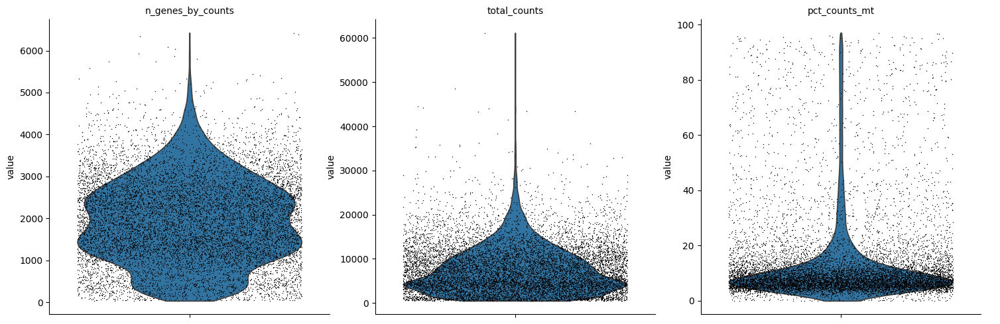

In [26]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

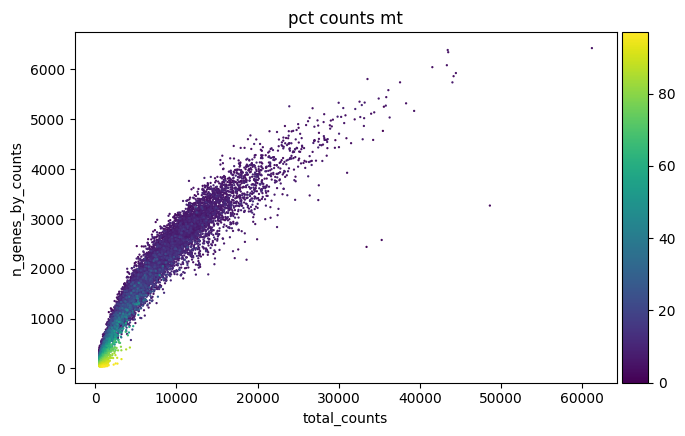

In [27]:
sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [28]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 106 cells that have less than 100 genes expressed
filtered out 13950 genes that are detected in less than 3 cells


In [29]:
print(adata.shape)
adata = adata[adata.obs.pct_counts_mt < 20, ]
print(adata.shape)

(10962, 22651)
(9547, 22651)


In [30]:
adata = adata[adata.obs.status == "singlet", :].copy()

In [31]:
adata.obs.value_counts("participant")

participant
SQ_Unhealthy_0    2623
SQ_Unhealthy_2    2107
SQ_Healthy_4      1443
SQ_Healthy_0       818
SQ_Unhealthy_3     811
SQ_Unhealthy_1     453
SQ_Healthy_1       374
SQ_Healthy_2       356
SQ_Healthy_3        80
SQ_Unhealthy_4      62
Name: count, dtype: int64

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'highly_variable_nbatches', int vector (adata.var)
    'highly_variable_intersection', boolean vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'residual_variances', float vector (adata.var)
computing analytic Pearson residuals on adata.X
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:02)


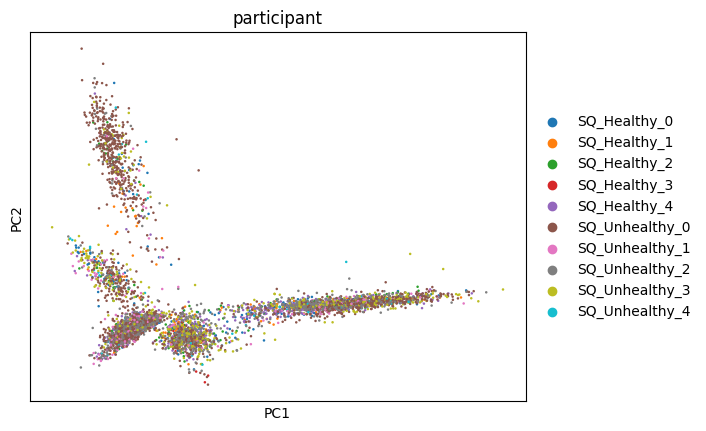

In [33]:
sc.experimental.pp.recipe_pearson_residuals(adata, batch_key="participant", theta=1)

sc.pl.pca(adata, color=["participant",])
plt.show()

In [37]:
adata.layers["counts"] = adata.X.copy()

In [38]:
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:02)


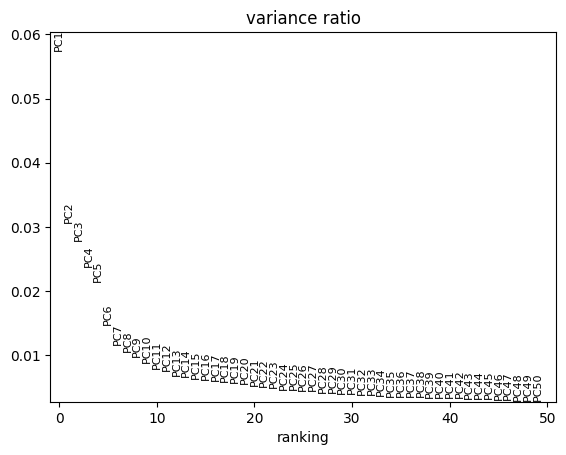

In [35]:
sc.pl.pca_variance_ratio(adata, n_pcs=50) #, log=True)

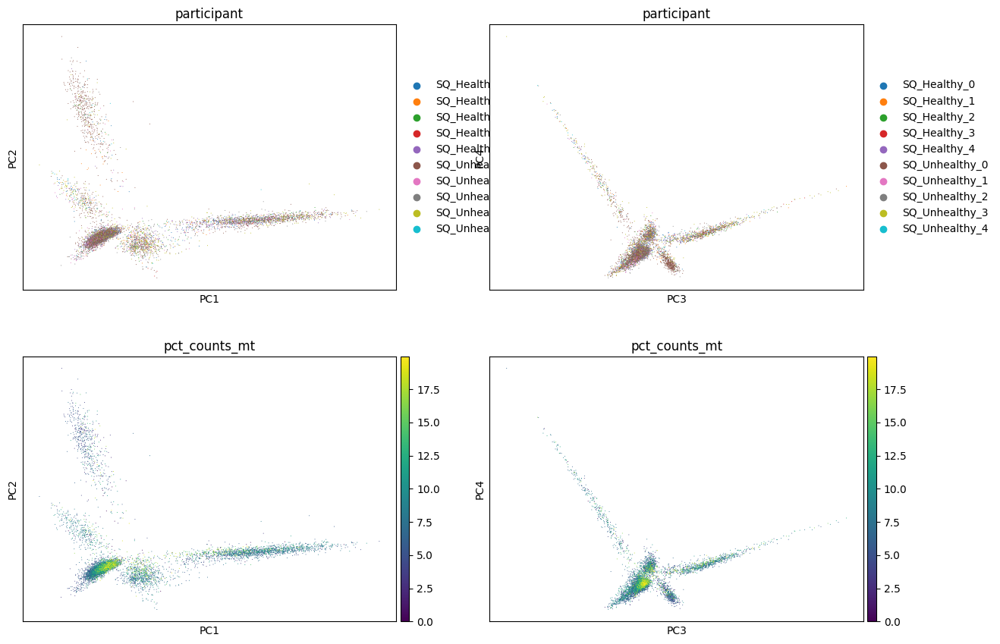

In [36]:
sc.pl.pca(
    adata,
    color=["participant", "participant", "pct_counts_mt", "pct_counts_mt"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=2,
)

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:27)


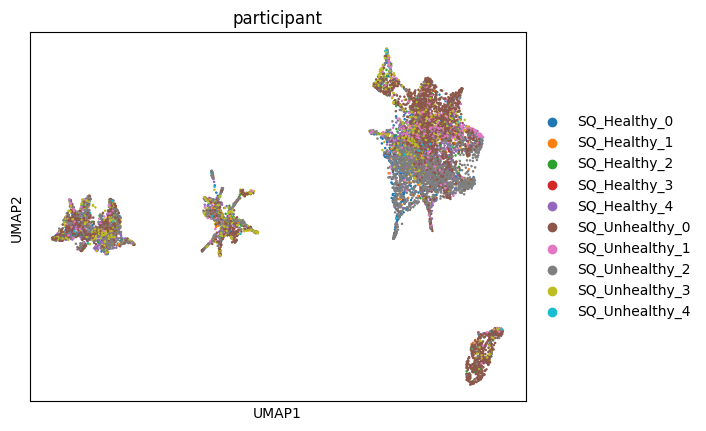

In [53]:
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata, )
sc.pl.umap(adata, color=["participant",])

In [54]:
res_list = [0.02, 0.2, 0.3, 0.4, 0.5, 0.6, 1]
for res in res_list:
    sc.tl.leiden(adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph")

running Leiden clustering
    finished: found 4 clusters and added
    'leiden_res_0.02', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_res_0.20', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_res_0.30', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_res_0.40', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_res_0.60', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden_res_1.00', the cluster labels (adata.obs, categorica

In [55]:
leiden_resolutions = [f"leiden_res_{res:4.2f}" for res in res_list]

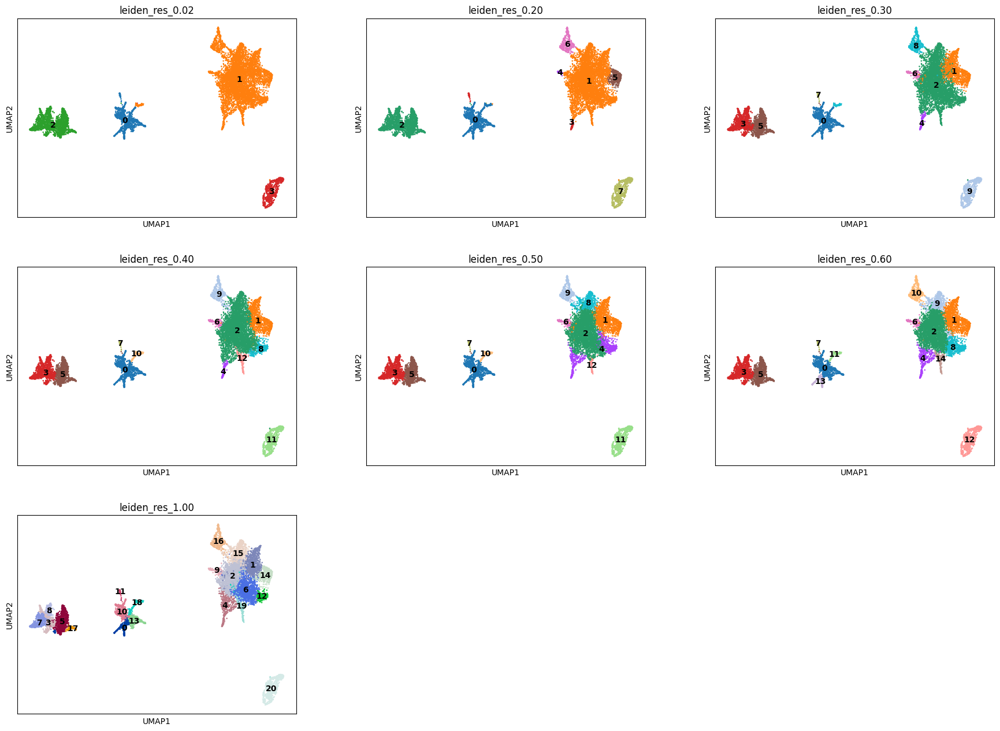

In [56]:
sc.pl.umap(
    adata,
    color=leiden_resolutions,
    ncols=3,
    legend_loc="on data",
)

In [65]:
leiden_clusters = "leiden_res_0.40"

In [69]:
sc.tl.rank_genes_groups(adata, groupby=leiden_clusters, method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


In [70]:
sc.tl.dendrogram(adata, groupby=leiden_clusters)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res_0.40']`


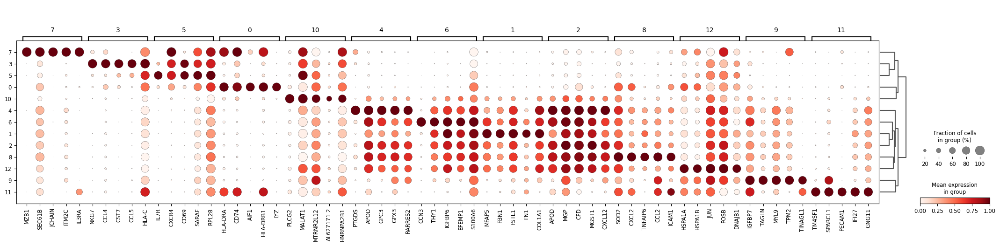

In [71]:
sc.pl.rank_genes_groups_dotplot(adata, groupby=leiden_clusters, standard_scale="var", n_genes=5)

In [46]:
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "Endothelial": ["VWF", ],
    "Myofibroblasts": ["ACTA2", ],
    "Mesothelial": ["MSLN",],
    "APC": ["PI16", ],
    "FAP": ["PDGFRA", "PDGFRB", "DPP4", "IGFBP2", "IGFBP6"],
    # "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    # Note: DMXL2 should be negative
    # "cDC2": ["CST3", "COTL1", "LYZ", "DMXL2", "CLEC10A", "FCER1A"],
    # "Erythroblast": ["MKI67", "HBA1", "HBB"],
    # Note HBM and GYPA are negative markers
    # "Proerythroblast": ["CDK6", "SYNGR1", "HBM", "GYPA"],
    "NK": ["FCGR3A", "KLRG1", "FCER1G"], # , "GNLY", "NKG7", "CD247", "TYROBP", 
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    # "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    # Note IGHD and IGHM are negative markers
    "B cells": [
        "CD19",
        "CD79A",
        # "COL4A4",
        # "PRDM1",
        # "IRF4",
        # "PAX5",
        # "BCL11A",
        # "BLK",
        # "IGHD",
        # "IGHM",
    ], #"MS4A1",
    "Plasma cells": ["JCHAIN", ], #"MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", 
    # Note PAX5 is a negative marker
    # "Plasmablast": ["XBP1", "PRDM1", "PAX5"],
    "CD4+ T": ["CD4", "IL7R", "TRBC2"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "T cells": ["CD3E",],
    "Immune": ["PTPRC", ]
}


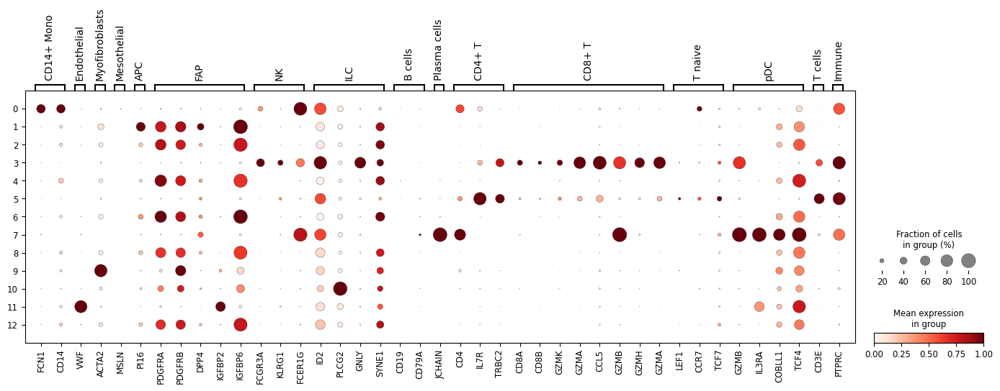

In [66]:
sc.pl.dotplot(adata, marker_genes, groupby=leiden_clusters, standard_scale="var")

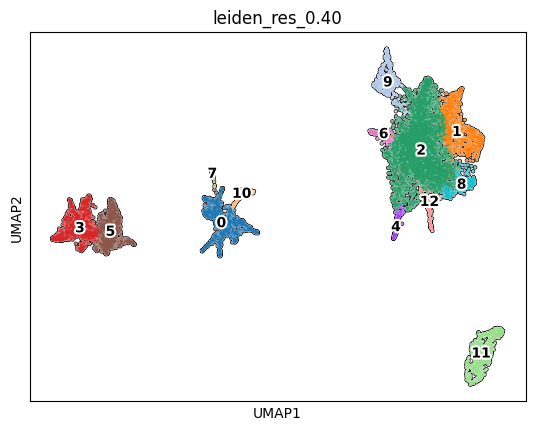

In [67]:
sc.pl.umap(
    adata,
    color=[leiden_clusters,],# "participant", "pct_counts_mt"],
    ncols=3,
    legend_loc="on data",
    add_outline=True,
    legend_fontoutline=3
)

In [74]:
labels = {
    '0': "Myeloid",
    '1': "PI16+ APCs",
    '2': "FAPs",
    "3": "CD8+ T cells",
    "4": "FAPs",
    "5": "CD4+ T cells",
    "6": "FAPs",
    "7": "B cells",
    "8": "FAPs",
    "9": "Myofibroblats",
    "10": "PLGC2+ cells",
    "11": "ECs",
    "12": "FAPs"
}

In [75]:
adata.obs["cell_type"] = [labels[cluster] for cluster in adata.obs[leiden_clusters]]

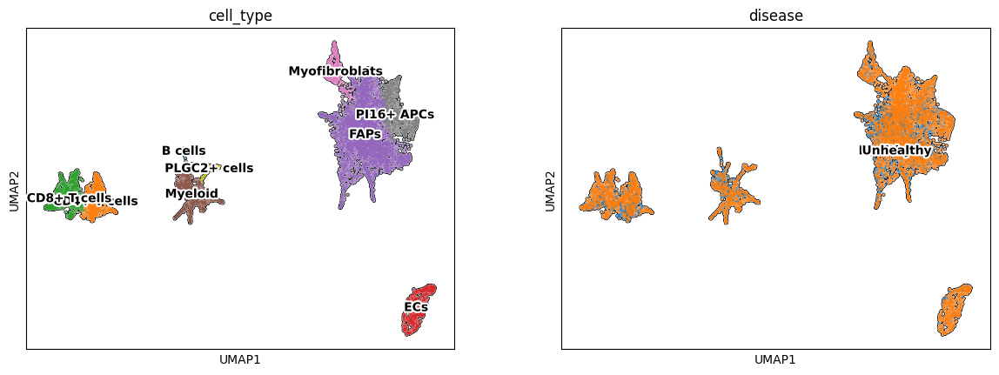

In [76]:
sc.pl.umap(
    adata,
    color=["cell_type", "disease"],
    ncols=3,
    legend_loc="on data",
    add_outline=True,
    legend_fontoutline=3
)

In [77]:
adata.obs["cd45"] = "neg"
adata.obs.loc[adata.obs.cell_type.isin(["Myeloid cells", "CD8+ T cells", "CD4+ T cells", "B cells"]), "cd45"] = "pos"

In [78]:
adata.write(os.path.join(INPUT_DIR, "sc", 'sq_reannotated_broadly.h5ad'))

In [79]:
adata.obs.value_counts("cell_type")

cell_type
FAPs             4596
CD8+ T cells      906
Myeloid           880
PI16+ APCs        864
CD4+ T cells      800
ECs               548
Myofibroblats     387
PLGC2+ cells      105
B cells            41
Name: count, dtype: int64

In [80]:
adata_all = adata.copy()

In [ ]:
dc_cluster_genes = sc.get.rank_genes_groups_df(adata, group="7").head(5)["names"]
sc.pl.umap(
    adata,
    color=[*dc_cluster_genes, leiden_clusters],
    legend_loc="on data",
    frameon=False,
    ncols=3,
)

# Immune

In [95]:
adata = adata_all[adata_all.obs.cell_type.isin(["Myeloid", "CD8+ T cells", "CD4+ T cells", "B cells", "PLGC2+ cells"]),:].copy()

In [96]:
adata.obs.value_counts("cell_type")

cell_type
CD8+ T cells    906
Myeloid         880
CD4+ T cells    800
PLGC2+ cells    105
B cells          41
Name: count, dtype: int64

In [97]:
adata.X = adata.layers["counts"].copy()

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'highly_variable_nbatches', int vector (adata.var)
    'highly_variable_intersection', boolean vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'residual_variances', float vector (adata.var)
computing analytic Pearson residuals on adata.X
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)


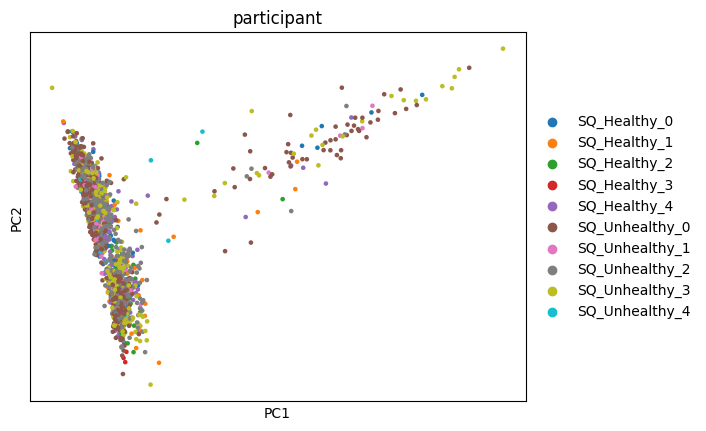

In [98]:
sc.experimental.pp.recipe_pearson_residuals(adata, batch_key="participant", theta=1)

sc.pl.pca(adata, color=["participant",])
plt.show()

In [99]:
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


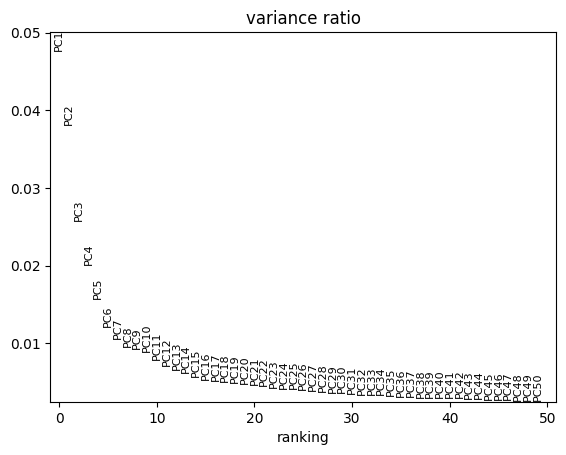

In [100]:
sc.pl.pca_variance_ratio(adata, n_pcs=50) #, log=True)

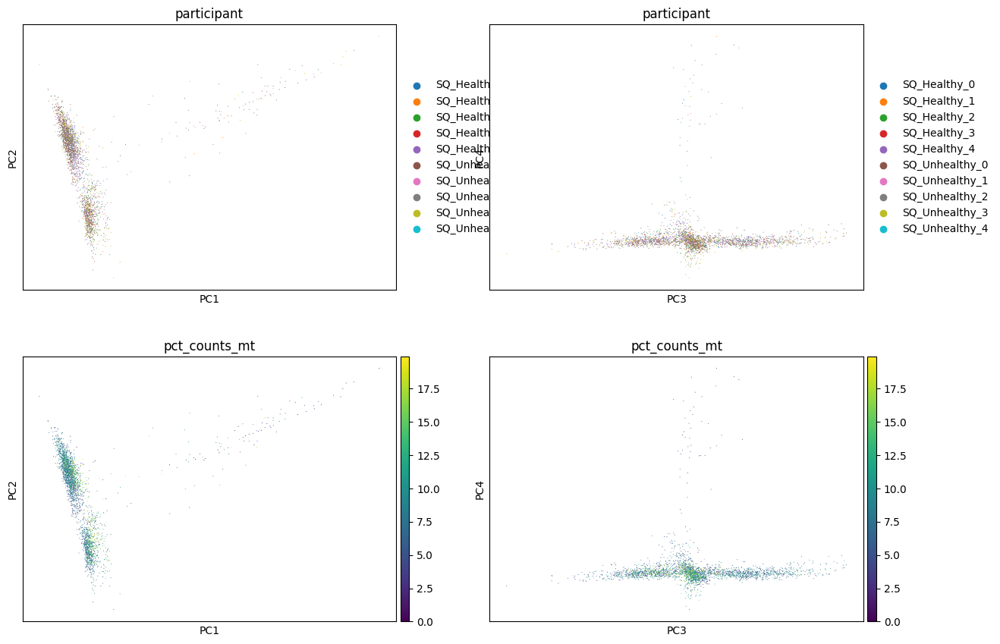

In [101]:
sc.pl.pca(
    adata,
    color=["participant", "participant", "pct_counts_mt", "pct_counts_mt"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=2,
)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:04)


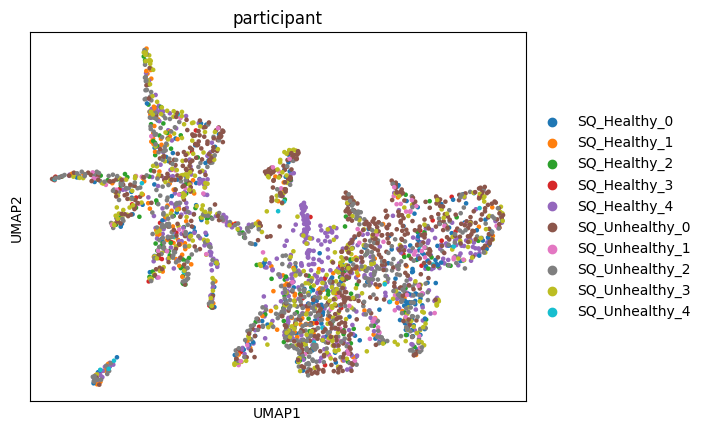

In [102]:
sc.pp.neighbors(adata, n_pcs=20, n_neighbors=10)
sc.tl.umap(adata, )
sc.pl.umap(adata, color=["participant",])

In [103]:
res_list = [0.02, 0.2, 0.3, 0.4, 0.5, 0.6, 1]
for res in res_list:
    sc.tl.leiden(adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph")

running Leiden clustering
    finished: found 2 clusters and added
    'leiden_res_0.02', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_res_0.20', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_res_0.30', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_res_0.40', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden_res_0.60', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 20 clusters and added
    'leiden_res_1.00', the cluster labels (adata.obs, categorica

In [104]:
leiden_resolutions = [f"leiden_res_{res:4.2f}" for res in res_list]

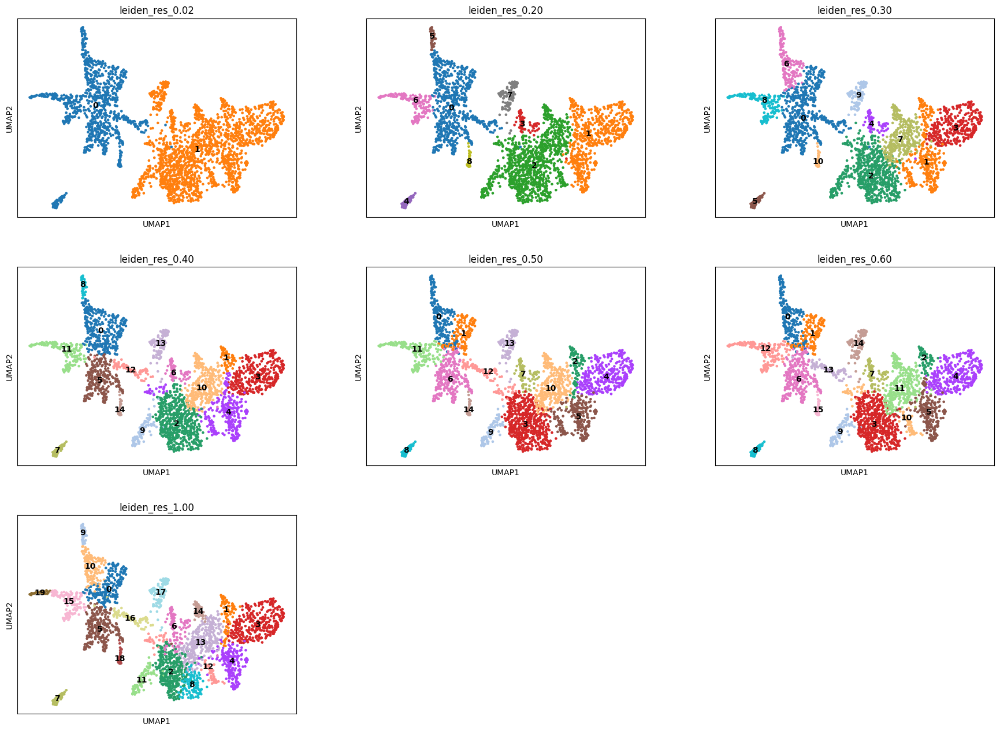

In [105]:
sc.pl.umap(
    adata,
    color=leiden_resolutions,
    ncols=3,
    legend_loc="on data",
)

In [106]:
leiden_clusters = "leiden_res_0.40"

In [107]:
sc.tl.rank_genes_groups(adata, groupby=leiden_clusters, method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


In [108]:
sc.tl.dendrogram(adata, groupby=leiden_clusters)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res_0.40']`


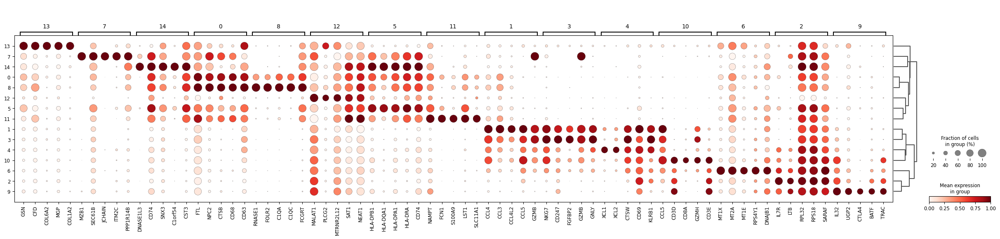

In [159]:
sc.pl.rank_genes_groups_dotplot(adata, groupby=leiden_clusters, standard_scale="var", n_genes=5)

In [167]:
marker_genes = {
    #"CD14+ Mono": ["FCN1", "CD14"],
    # "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    # Note: DMXL2 should be negative
    # "cDC2": ["CST3", "COTL1", "LYZ", "DMXL2", "CLEC10A", "FCER1A"],
    # "Erythroblast": ["MKI67", "HBA1", "HBB"],
    # Note HBM and GYPA are negative markers
    # "Proerythroblast": ["CDK6", "SYNGR1", "HBM", "GYPA"],
   # "NK": ["FCGR3A", "KLRG1", "FCER1G"], # , "GNLY", "NKG7", "CD247", "TYROBP", 
   # "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    # "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    # Note IGHD and IGHM are negative markers
   # "B cells": [
    #    "CD19",
    #    "CD79A",
        # "COL4A4",
        # "PRDM1",
        # "IRF4",
        # "PAX5",
        # "BCL11A",
        # "BLK",
        # "IGHD",
        # "IGHM",
    #], #"MS4A1",
    #"Plasma cells": ["JCHAIN", ], #"MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", 
    # Note PAX5 is a negative marker
    # "Plasmablast": ["XBP1", "PRDM1"],
    #"CD4+ T": ["CD4", "IL7R", "TRBC2"],
    #"CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    #"T naive": ["LEF1", "CCR7", "TCF7"],
   # "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    #"T cells": ["CD3E", "LEF1"],
   # "Immune": ["PTPRC", "TCF7", "GZMB", "GZMK", "CCR7"],
   # "Non-immune": ["PDGFRA", "PDGFRB", "VIM", "PI16"],
    #"Naive T cells": [
#"CCR7",
#"TCF7",
#"LEF1",
#"IL7R",
# #"LTB",
# "MAL",
# "TRAC",
# "TRBC1",
# "TRBC2", "GZMB",
# "PRF1",
# "NKG7",
# "CCL5",
# "IFNG",
# "TBX21"
# ]
    "plcg2_myeloid_markers": [
"CSF1R",
"LYZ",
"LST1",
"TYROBP",
"CTSS",
"FCGR3A",
"HLA-DRA",
"CD68"
],
    "dc_markers": [
"ITGAX",
"CD1C",
"FCER1A",
"CLEC10A",
"IRF8",
"BATF3",
"XCR1", "CLEC4C"
]
   # "all": ["LYVE1", "TREM2", "FCGR3A", "LAMP3", "TACSTD2", "MRC1", "HLA-DRA", "CD68", "IL7R", "HES4", "FCGR2B", "FCER1A", "CLEC10A", "CEBPB", "IRF1", "FSCN1", "CLEC9A", "WDFY4", "XCR1"]
}


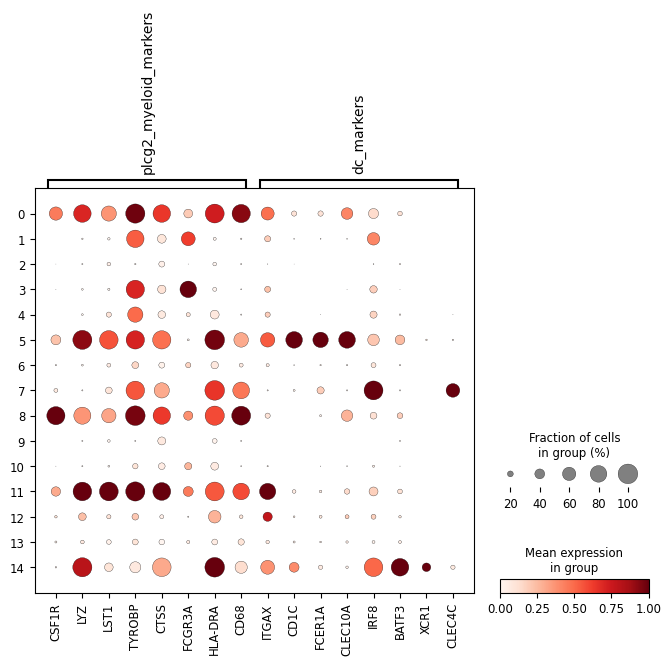

In [168]:
sc.pl.dotplot(adata, marker_genes, groupby=leiden_clusters, standard_scale="var")

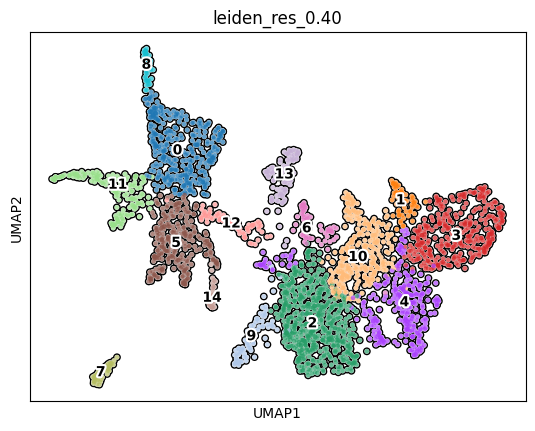

In [112]:
sc.pl.umap(
    adata,
    color=[leiden_clusters,],# "participant", "pct_counts_mt"],
    ncols=3,
    legend_loc="on data",
    add_outline=True,
    legend_fontoutline=3
)

In [169]:
labels = {
    '0': "LAMs",
    '1': "GD T cells",
    '2': "CD4+ T cells",
    "3": "mNK2 cells",
    "4": "mNK1 cells",
    "5": "cDC2Bs",
    "6": "CD4+ T cells",
    "7": "B cells",
    "8": "PVMs",
    "9": "Tregs",
    "10": "CD8+ T cells",
    "11": "Monocytes",
    "12": "PLCG2+ cells",
    "13": "FAPs",
    "14": "cDC1s"
}

In [170]:
adata.obs["cell_type1"] = [labels[cluster] for cluster in adata.obs[leiden_clusters]]

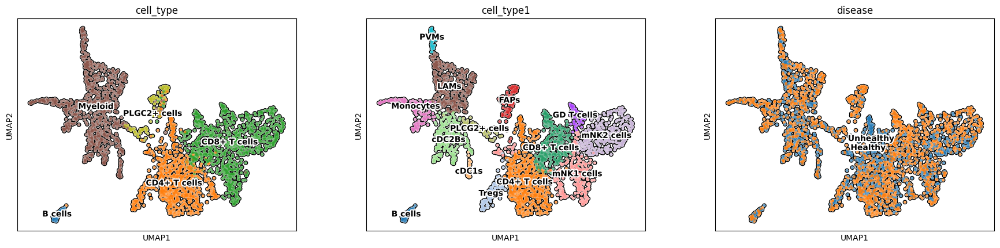

In [171]:
sc.pl.umap(
    adata,
    color=["cell_type", "cell_type1", "disease"],
    ncols=3,
    legend_loc="on data",
    add_outline=True,
    legend_fontoutline=3
)

In [172]:
adata.write(os.path.join(INPUT_DIR, "sc", 'sq_immune_annotated.h5ad'))

In [174]:
adata.obs.value_counts("cell_type1")

cell_type1
CD4+ T cells    613
LAMs            329
mNK2 cells      321
CD8+ T cells    304
mNK1 cells      293
cDC2Bs          259
Monocytes       176
FAPs            100
Tregs            86
PLCG2+ cells     76
GD T cells       62
B cells          42
PVMs             41
cDC1s            30
Name: count, dtype: int64

In [179]:
adata_all.obs.loc[adata.obs.loc[adata.obs.cell_type1 == "FAPs",:].index, "cell_type"] = "FAPs"

# Non-immune

In [180]:
adata = adata_all[~adata_all.obs.cell_type.isin(["Myeloid", "CD8+ T cells", "CD4+ T cells", "B cells", "PLGC2+ cells"]),:].copy()

In [181]:
adata.obs.value_counts("cell_type")

cell_type
FAPs             4696
PI16+ APCs        864
ECs               548
Myofibroblats     387
Name: count, dtype: int64

In [182]:
adata.X = adata.layers["counts"].copy()

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'highly_variable_nbatches', int vector (adata.var)
    'highly_variable_intersection', boolean vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'residual_variances', float vector (adata.var)
computing analytic Pearson residuals on adata.X
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:01)


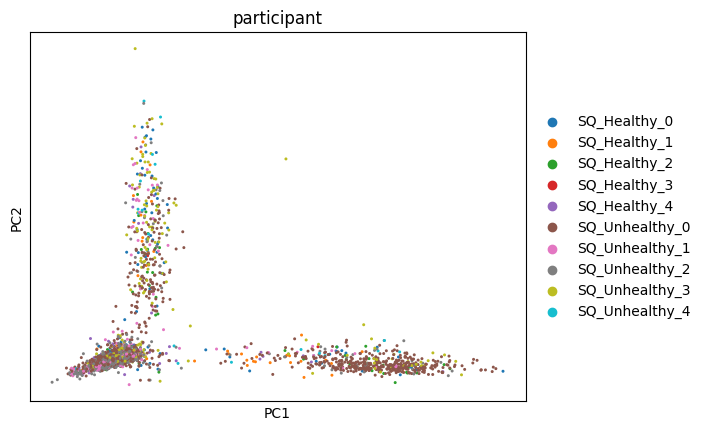

In [183]:
sc.experimental.pp.recipe_pearson_residuals(adata, batch_key="participant", theta=1)

sc.pl.pca(adata, color=["participant",])
plt.show()

In [186]:
adata.var.value_counts(["highly_variable_nbatches", "highly_variable_intersection", "highly_variable"]).sort_index()

highly_variable_nbatches  highly_variable_intersection  highly_variable
0                         False                         False              17717
1                         False                         False               3130
2                         False                         False                804
                                                        True                  26
3                         False                         True                 299
4                         False                         True                 164
5                         False                         True                 112
6                         False                         True                 116
7                         False                         True                  75
8                         False                         True                  61
9                         False                         True                  82
10                        True       

In [187]:
sc.pp.normalize_total(adata)
# Logarithmize the data
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


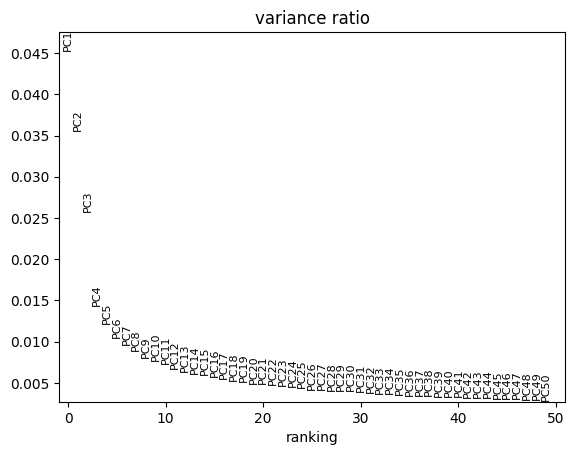

In [188]:
sc.pl.pca_variance_ratio(adata, n_pcs=50) #, log=True)

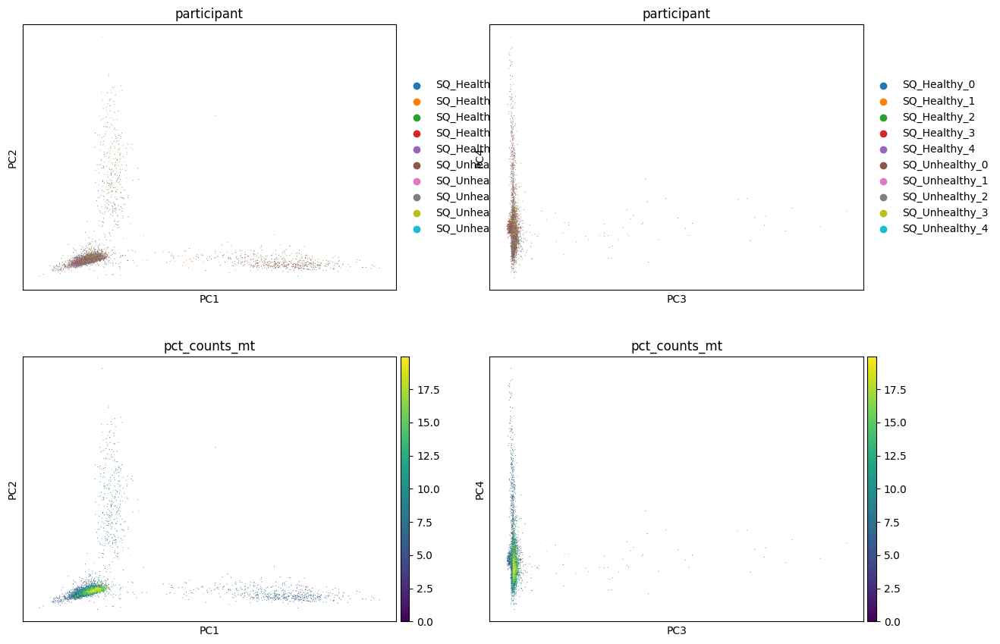

In [189]:
sc.pl.pca(
    adata,
    color=["participant", "participant", "pct_counts_mt", "pct_counts_mt"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=2,
)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:09)


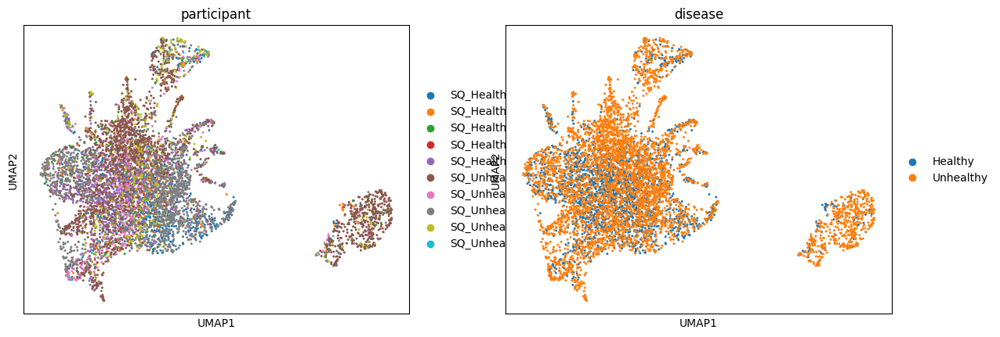

In [192]:
sc.pp.neighbors(adata, n_pcs=20, n_neighbors=10)
sc.tl.umap(adata, )
sc.pl.umap(adata, color=["participant", "disease"])

In [193]:
res_list = [0.02, 0.2, 0.3, 0.4, 0.5, 0.6, 1]
for res in res_list:
    sc.tl.leiden(adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph")

running Leiden clustering
    finished: found 3 clusters and added
    'leiden_res_0.02', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_res_0.20', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_res_0.30', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_res_0.40', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden_res_0.60', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 23 clusters and added
    'leiden_res_1.00', the cluster labels (adata.obs, categorica

In [194]:
leiden_resolutions = [f"leiden_res_{res:4.2f}" for res in res_list]

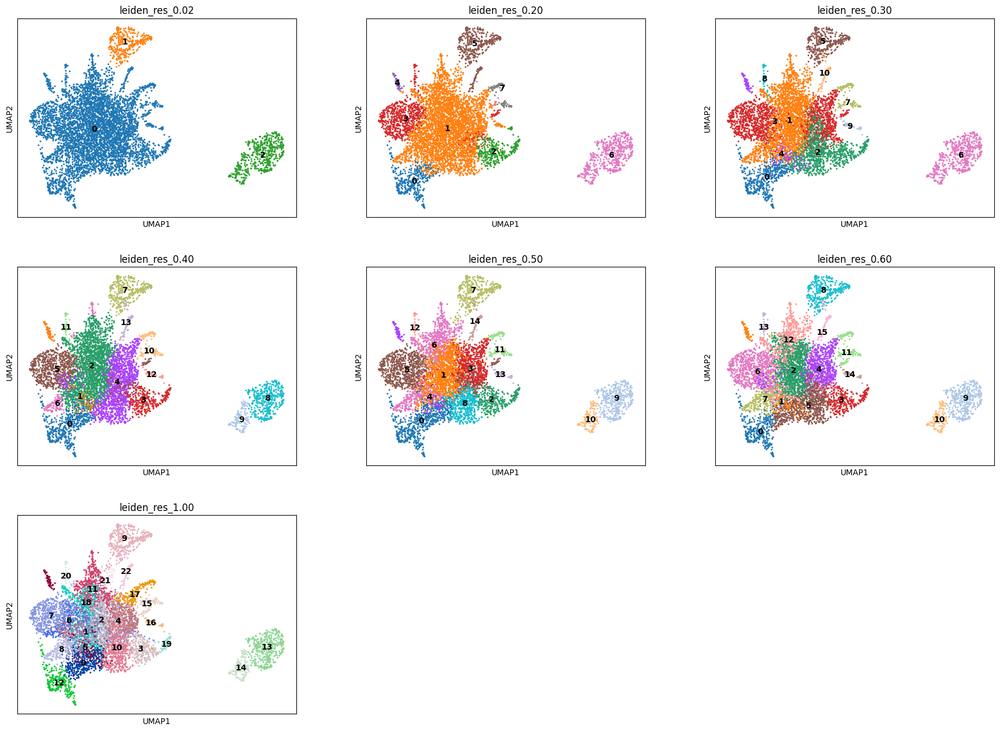

In [195]:
sc.pl.umap(
    adata,
    color=leiden_resolutions,
    ncols=3,
    legend_loc="on data",
)

In [196]:
leiden_clusters = "leiden_res_0.40"

In [197]:
sc.tl.rank_genes_groups(adata, groupby=leiden_clusters, method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)


In [198]:
sc.tl.dendrogram(adata, groupby=leiden_clusters)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res_0.40']`


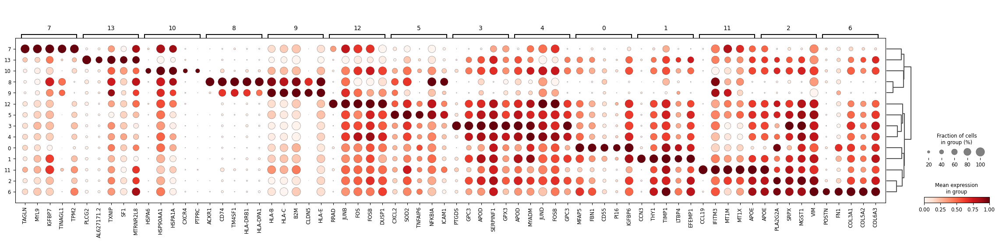

In [199]:
sc.pl.rank_genes_groups_dotplot(adata, groupby=leiden_clusters, standard_scale="var", n_genes=5)

In [231]:
marker_genes = {
    #"CD14+ Mono": ["FCN1", "CD14"],
    # "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    # Note: DMXL2 should be negative
    # "cDC2": ["CST3", "COTL1", "LYZ", "DMXL2", "CLEC10A", "FCER1A"],
    # "Erythroblast": ["MKI67", "HBA1", "HBB"],
    # Note HBM and GYPA are negative markers
    # "Proerythroblast": ["CDK6", "SYNGR1", "HBM", "GYPA"],
   # "NK": ["FCGR3A", "KLRG1", "FCER1G"], # , "GNLY", "NKG7", "CD247", "TYROBP", 
   # "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    # "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    # Note IGHD and IGHM are negative markers
   # "B cells": [
    #    "CD19",
    #    "CD79A",
        # "COL4A4",
        # "PRDM1",
        # "IRF4",
        # "PAX5",
        # "BCL11A",
        # "BLK",
        # "IGHD",
        # "IGHM",
    #], #"MS4A1",
    #"Plasma cells": ["JCHAIN", ], #"MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", 
    # Note PAX5 is a negative marker
    # "Plasmablast": ["XBP1", "PRDM1"],
    #"CD4+ T": ["CD4", "IL7R", "TRBC2"],
    #"CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    #"T naive": ["LEF1", "CCR7", "TCF7"],
   # "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    #"T cells": ["CD3E", "LEF1"],
   # "Immune": ["PTPRC", "TCF7", "GZMB", "GZMK", "CCR7"],
   # "Non-immune": ["PDGFRA", "PDGFRB", "VIM", "PI16"],
    #"Naive T cells": [
#"CCR7",
#"TCF7",
#"LEF1",
#"IL7R",
# #"LTB",
# "MAL",
# "TRAC",
# "TRBC1",
# "TRBC2", "GZMB",
# "PRF1",
# "NKG7",
# "CCL5",
# "IFNG",
# "TBX21"
# ]

    # Broad progenitor identity — should be expressed across all progenitor clusters
    "Pan_Progenitor": [
        "PI16", "CD34", "DLK1", "PDGFRA",
        "LY6E", "ANPEP", "NT5E", "THY1",
        "ENG", "ITGA6", "ABCG2"
    ],

    # Most primitive, multipotent — DPP4+ interstitial progenitors
    # (Merrick et al. 2019 framework)
    "DPP4_Interstitial_Progenitor": [
        "DPP4", "CD55", "FBLN1", "FBLN2",
        "MFAP4", "CFD", "GSN", "APOD", "C3"
    ],

    # Committed to adipogenic fate but not yet differentiating
    # High DLK1, ICAM1 — (Merrick et al. 2019 framework)
    "ICAM1_Committed_Preadipocyte": [
        "ICAM1", "DLK1", "ANXA3", "CEBPA",
        "KLF4", "SFRP4", "CD36", "RORB", "WNT5A"
    ],

    # Anti-adipogenic regulatory population — suppresses adipogenesis of neighbours
    # CD142/F3+ Aregs (Schwalie et al. 2018)
    "CD142_Areg_Antiadipogenic": [
        "F3", "PTGS1", "MEOX2", "HHIP",
        "WNT2", "SEMA3C", "GPC3"
    ],

    # Early commitment — transcription factor cascade, stage 1
    "TF_Early_Commitment": [
        "KLF4", "KLF5", "CEBPB", "CEBPD",
        "GATA2", "GATA3", "SFRP1", "SFRP2"
    ],

    # Mid commitment — transcription factor cascade, stage 2
    "TF_Mid_Commitment": [
        "CEBPA", "SREBF1", "SREBF2", "PPARD",
        "KLF15", "NRIP1", "TRIB3", "RXRA"
    ],

    # Late preadipocyte / early lipid loading — approaching terminal differentiation
    # PPARG low-mod, FABP4 low — NOT yet a mature adipocyte
    "Late_Preadipocyte": [
        "PPARG", "FABP4", "LPL", "PLIN2",
        "DGAT1", "ADIPOQ", "KLF15", "ACSL1"
    ],

    # Subcutaneous abdominal depot identity markers
    # HOXA-cluster enriched in subcutaneous vs visceral
    # Use to confirm subcutaneous origin of your progenitor clusters
    "Subcutaneous_Abdominal_Identity": [
        "HOXA5", "HOXA9", "HOXA10", "IRX2",
        "SHOX2", "SORBS1", "SFXN1"
    ]
   # "all": ["LYVE1", "TREM2", "FCGR3A", "LAMP3", "TACSTD2", "MRC1", "HLA-DRA", "CD68", "IL7R", "HES4", "FCGR2B", "FCER1A", "CLEC10A", "CEBPB", "IRF1", "FSCN1", "CLEC9A", "WDFY4", "XCR1"]
}


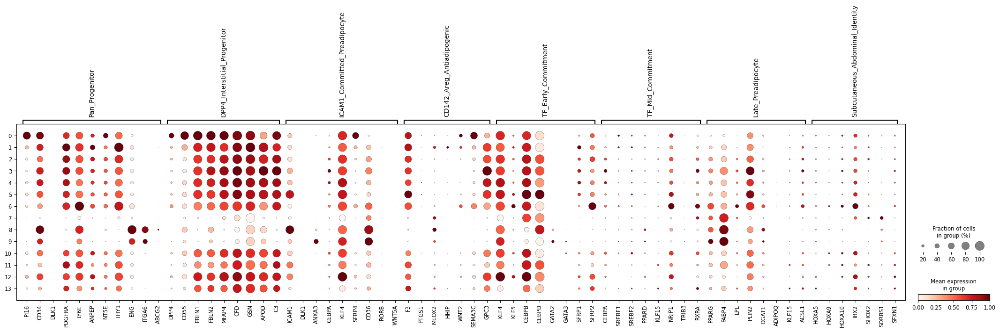

In [232]:
sc.pl.dotplot(adata, marker_genes, groupby=leiden_clusters, standard_scale="var")

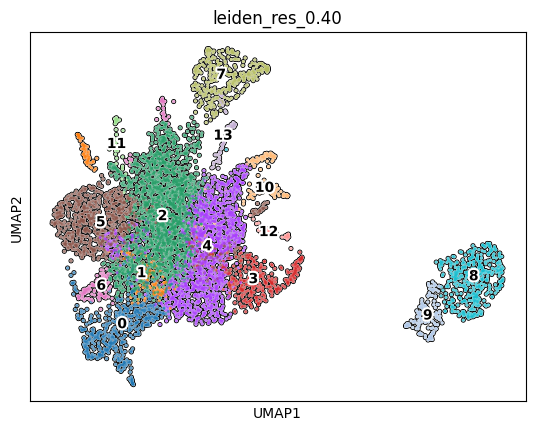

In [202]:
sc.pl.umap(
    adata,
    color=[leiden_clusters,],# "participant", "pct_counts_mt"],
    ncols=3,
    legend_loc="on data",
    add_outline=True,
    legend_fontoutline=3
)

In [246]:
labels = {
    '0': "Pre-adipocytes",
    '1': "FAPs",
    '2': "FAPs",
    "3": "FAPs",
    "4": "FAPs",
    "5": "FAPs",
    "6": "Pre-adipocytes",
    "7": "Myofibroblasts",
    "8": "LECs",
    "9": "VECs",
    "10": "FAPs",
    "11": "FAPs",
    "12": "FAPs",
    "13": "FAPs"
}

In [248]:
adata.obs["cell_type1"] = [labels[cluster] for cluster in adata.obs[leiden_clusters]]

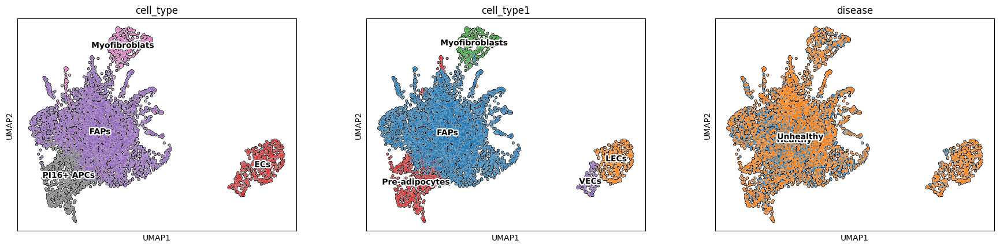

In [250]:
sc.pl.umap(
    adata,
    color=["cell_type", "cell_type1", "disease"],
    ncols=3,
    legend_loc="on data",
    add_outline=True,
    legend_fontoutline=3
)

In [251]:
adata.write(os.path.join(INPUT_DIR, "sc", 'sq_nonimmune_annotated.h5ad'))

In [240]:
adata.obs.value_counts("cell_type1")

cell_type1
FAPs              4983
Pre-adipocytes     634
LECs               408
Myofibroblasts     329
ECs                141
Name: count, dtype: int64

# Combining annotations together

In [252]:
adata_all = sc.read_h5ad(os.path.join(INPUT_DIR, "sc", 'sq_reannotated_broadly.h5ad'))
adata_im = sc.read_h5ad(os.path.join(INPUT_DIR, "sc", 'sq_immune_annotated.h5ad'))
adata_nonim = sc.read_h5ad(os.path.join(INPUT_DIR, "sc", 'sq_nonimmune_annotated.h5ad'))

In [253]:
adata_nonim.obs.value_counts(["cell_type1",]).sort_index()

cell_type1    
FAPs              4983
LECs               408
Myofibroblasts     329
Pre-adipocytes     634
VECs               141
Name: count, dtype: int64

In [254]:
adata_im.obs.value_counts(["cell_type1",]).sort_index()

cell_type1  
B cells          42
CD4+ T cells    613
CD8+ T cells    304
FAPs            100
GD T cells       62
LAMs            329
Monocytes       176
PLCG2+ cells     76
PVMs             41
Tregs            86
cDC1s            30
cDC2Bs          259
mNK1 cells      293
mNK2 cells      321
Name: count, dtype: int64

In [255]:
adata_all.obs["cell_type1"] = None

adata_all.obs.loc[adata_im.obs_names, "cell_type1"] = adata_im.obs["cell_type1"].values

adata_all.obs.loc[adata_nonim.obs_names, "cell_type1"] = adata_nonim.obs["cell_type1"].values

In [256]:
with pd.option_context('display.max_rows', None):
    print(adata_all.obs.value_counts(["cell_type", "cell_type1"]).sort_index())

cell_type      cell_type1    
B cells        B cells             41
CD4+ T cells   B cells              1
               CD4+ T cells       586
               CD8+ T cells        36
               FAPs                17
               PLCG2+ cells         2
               Tregs               86
               mNK1 cells          72
CD8+ T cells   CD4+ T cells        25
               CD8+ T cells       268
               FAPs                12
               GD T cells          61
               mNK1 cells         219
               mNK2 cells         321
ECs            FAPs                 1
               LECs               407
               VECs               140
FAPs           FAPs              4522
               LECs                 1
               Myofibroblasts       3
               Pre-adipocytes      69
               VECs                 1
Myeloid        CD4+ T cells         2
               FAPs                10
               GD T cells           1
               LAMs 

In [267]:
celltypes = {
'ECs': ["VECs", "LECs"],
 'Myofibroblasts': ["Myofibroblasts"],
 'FAPs': ["FAPs", "FAP1", "FAP2", "FAP3"],
 'Myeloid cells': ["PVMs", "Neutrophils", "LAMs", "Monocytes", "DC", "pDCs", "CD9+ ATM", "PLCG2+ cells", "cDC2Bs", "cDC1s"],
 'Mesothelial': ["Mesothelial cells", "MMT cells"],
 'T cells': ["CD4+ T cells", "GD T cells", "Effector CD8+ T cells", "CD8+ T cells", "CD8+ TRM", "NA CD4+ T cells", "CM CD4+ T cells", "EM CD4+ T cells", "Tregs"],
 'IGFBP2+ cells': ["IGFBP2+",],
 'NK cells': ["mNK3 cells", "mNK1 cells", "mNK2 cells"],
 'Pre-adipocytes': ["Pre-adipocytes",],
 'B cells': ["B cells",],
 'Plasma cells': ["Plasma cells",],
}

celltypes_rev = {}

for cell_type, l in celltypes.items():
    for cell_type1 in l:
        celltypes_rev[cell_type1] = cell_type


In [ ]:
# FAPs and APCs cell-types correction
# adata_all.obs.loc[adata_all.obs.cell_type == "APCs", "cell_type1"] = "PI16+ APCs"
# adata_all.obs.loc[adata_all.obs.cell_type == "FAPs", "cell_type1"] = "FAPs"
# adata_all.obs.loc[adata_all.obs.cell_type1.isin(["FAP1", "FAP2", "FAP3"]), "cell_type1"] = "FAPs"
# adata_all.obs.loc[adata_all.obs.cell_type1 == "PI16+ APC", "cell_type1"] = "PI16+ APCs"

In [ ]:
adata_all.obs.cell_type1 = adata_all.obs.cell_type1.astype(str)
# adata_all.obs.loc[adata_all.obs.cell_type1 == "DC", "cell_type1"] = "cDCs"

In [268]:
adata_all.obs["cell_type"] = adata_all.obs["cell_type"].astype(str)

for i, row in adata_all.obs.iterrows():
    adata_all.obs.loc[i, "cell_type"] = celltypes_rev[row["cell_type1"]]

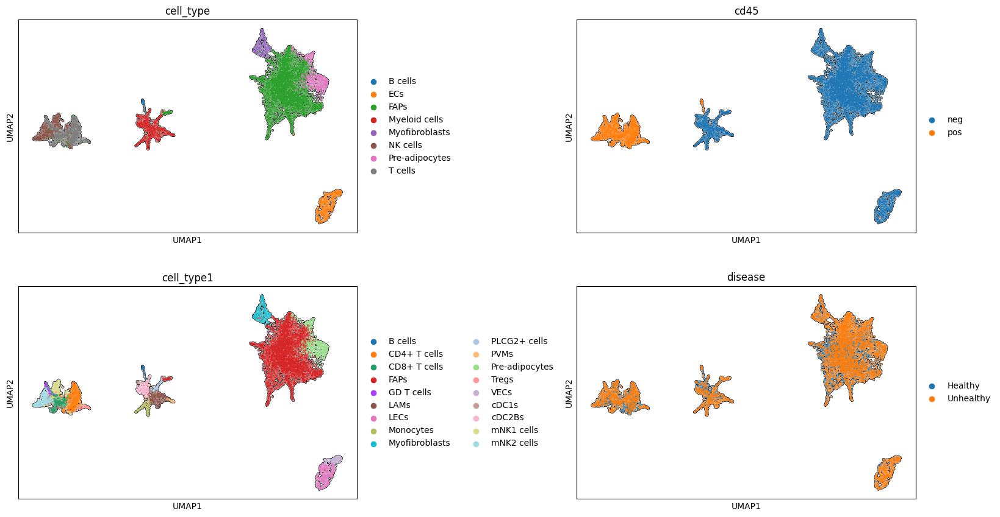

In [290]:
# fig, ax = plt.subplots(figsize=(12, 12))
fig = sc.pl.umap(
    adata_all,
    color=["cell_type", "cd45", "cell_type1", "disease"],
    ncols=2,
    # legend_loc="on data",
    add_outline=True,
    legend_fontoutline=2,
    return_fig=True,
    wspace=0.5
    # ax=ax
)
# fig.tight_layout()

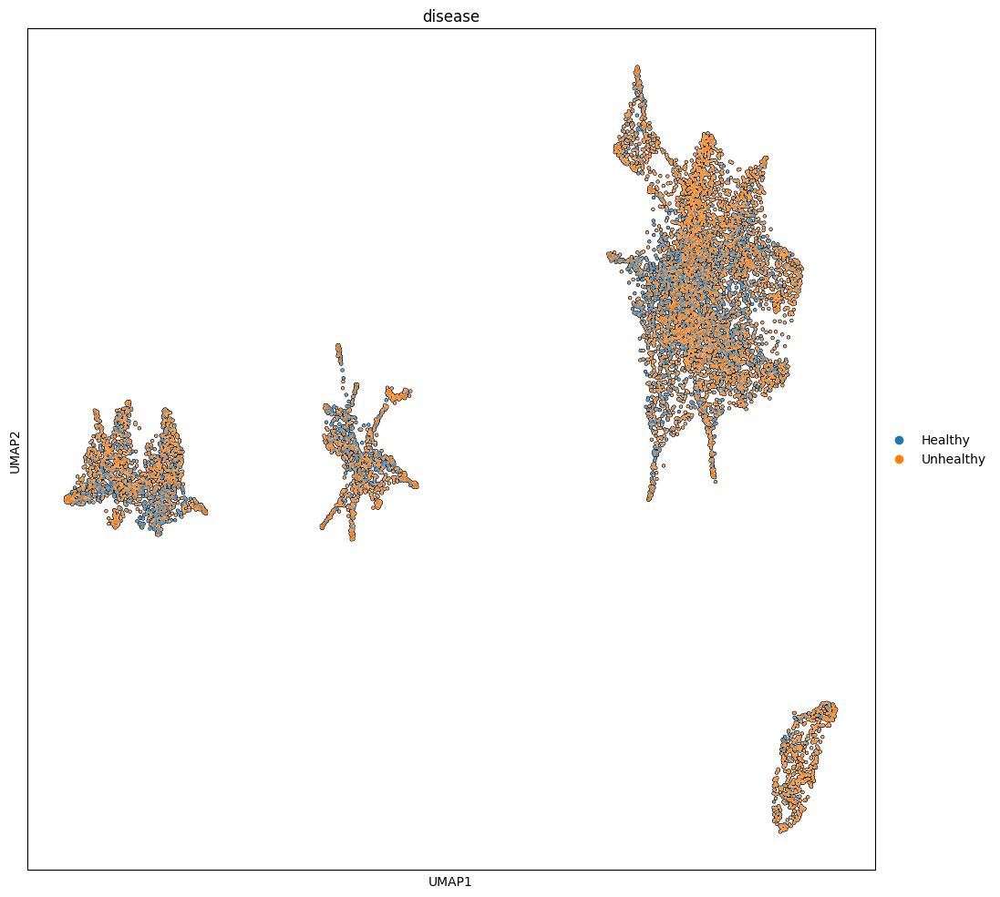

In [279]:
fig, ax = plt.subplots(figsize=(12, 12))
sc.pl.umap(
    adata_all,
    color=["disease"],
    ncols=3,
    # legend_loc="on data",
    add_outline=True,
    legend_fontoutline=2,
    ax=ax
)

In [292]:
adata_all.obs.value_counts(["cd45", "cell_type"]).sort_index()

cd45  cell_type     
neg   ECs                549
      FAPs              4983
      Myofibroblasts     329
      Pre-adipocytes     634
pos   B cells             42
      Myeloid cells      911
      NK cells           614
      T cells           1065
Name: count, dtype: int64

In [291]:
adata_all.obs["cd45"] = "neg"
adata_all.obs.loc[adata_all.obs.cell_type.isin(["T cells", "B cells", "Myeloid cells", "NK cells"]), "cd45"] = "pos"

In [293]:
adata_all.write(os.path.join(INPUT_DIR, "sc", 'sq_reannotated_finely.h5ad'))

# Figures

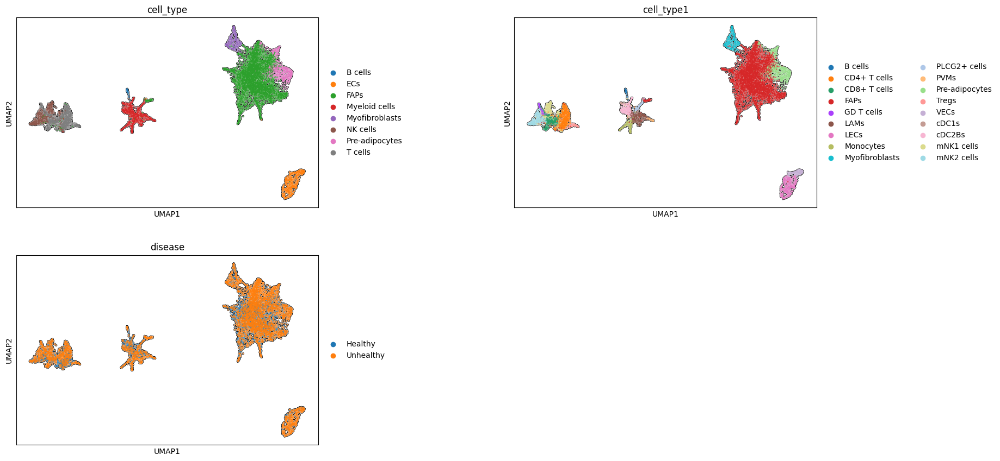

In [322]:
# fig, ax = plt.subplots(figsize=(12, 12))
fig = sc.pl.umap(
    adata_all,
    color=["cell_type", "cell_type1", "disease"],
    ncols=2,
    # legend_loc="on data",
    add_outline=True,
    legend_fontoutline=2,
    return_fig=True,
    wspace=0.5
    # ax=ax
)
# fig.tight_layout()

In [319]:
adata_im = sc.read_h5ad(os.path.join(INPUT_DIR, "sc", 'sq_immune_annotated.h5ad'))
adata_nonim = sc.read_h5ad(os.path.join(INPUT_DIR, "sc", 'sq_nonimmune_annotated.h5ad'))

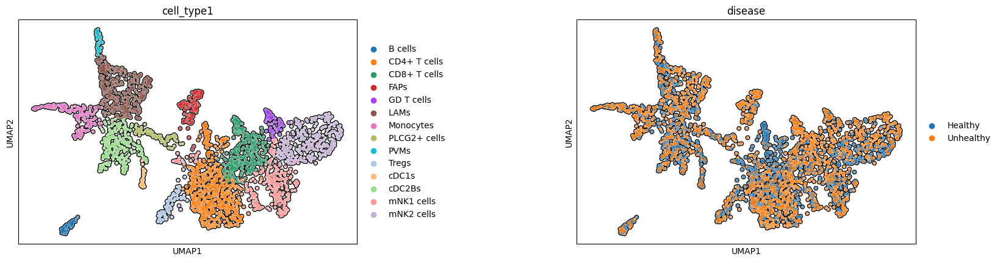

In [320]:
# fig, ax = plt.subplots(figsize=(12, 12))
fig = sc.pl.umap(
    adata_im,
    color=["cell_type1", "disease"],
    ncols=2,
    # legend_loc="on data",
    add_outline=True,
    legend_fontoutline=2,
    return_fig=True,
    wspace=0.5
    # ax=ax
)
# fig.tight_layout()

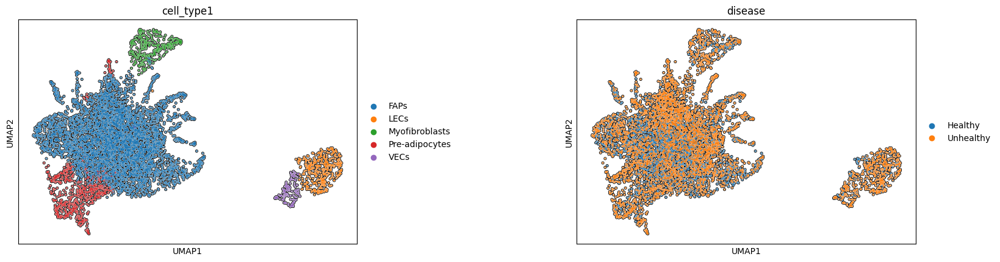

In [321]:
# fig, ax = plt.subplots(figsize=(12, 12))
fig = sc.pl.umap(
    adata_nonim,
    color=["cell_type1", "disease"],
    ncols=2,
    # legend_loc="on data",
    add_outline=True,
    legend_fontoutline=2,
    return_fig=True,
    wspace=0.5
    # ax=ax
)
# fig.tight_layout()

## Counts by participant by cell-type

In [331]:
adata_all = sc.read_h5ad(os.path.join(INPUT_DIR, "sc", 'sq_reannotated_finely.h5ad'))
tissue = "SubQ"

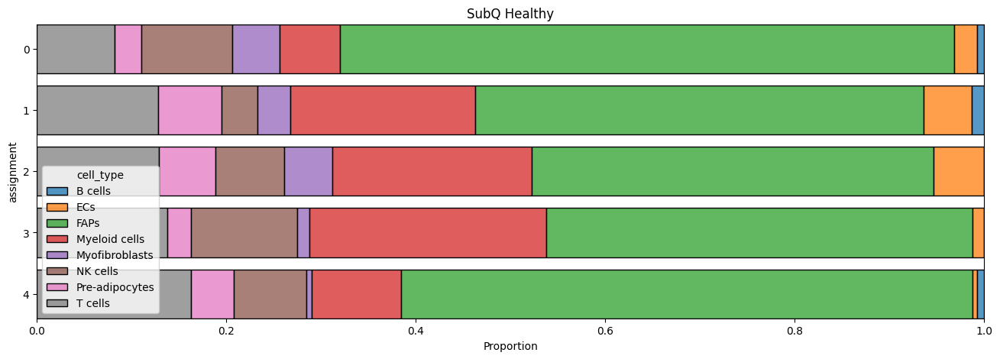

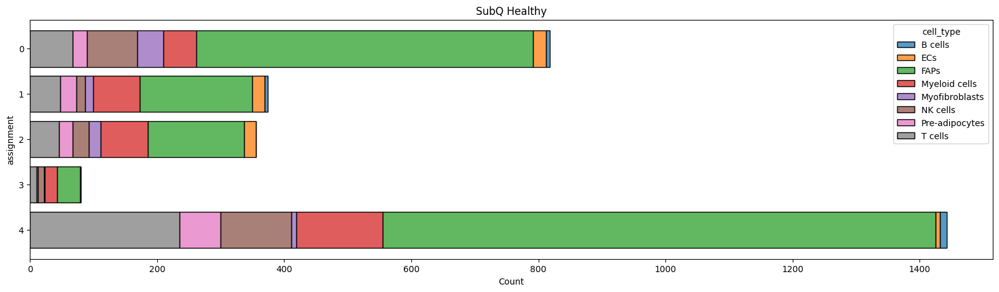

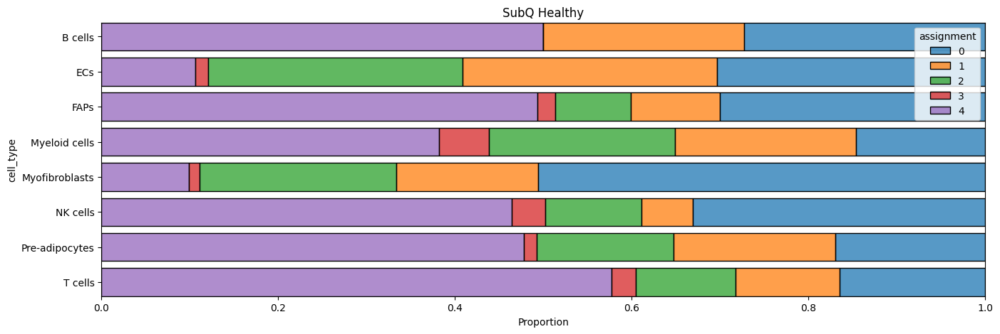

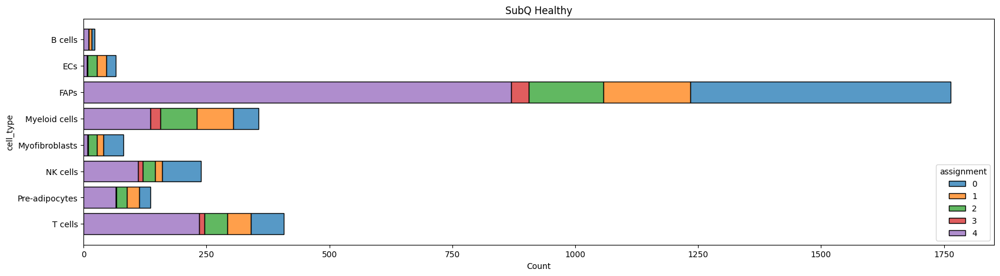

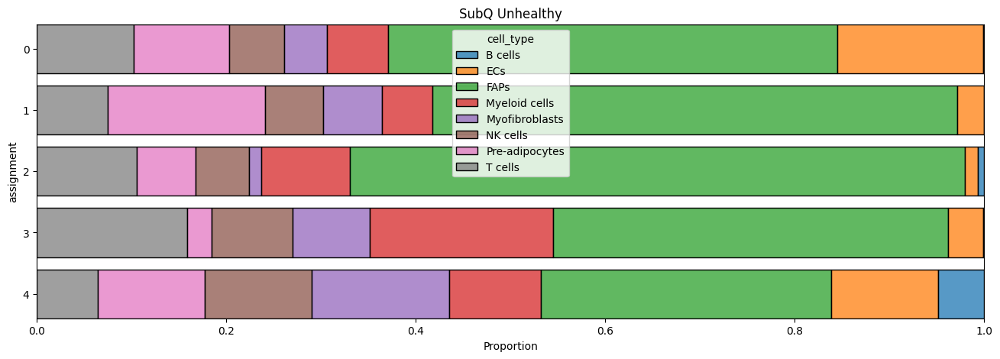

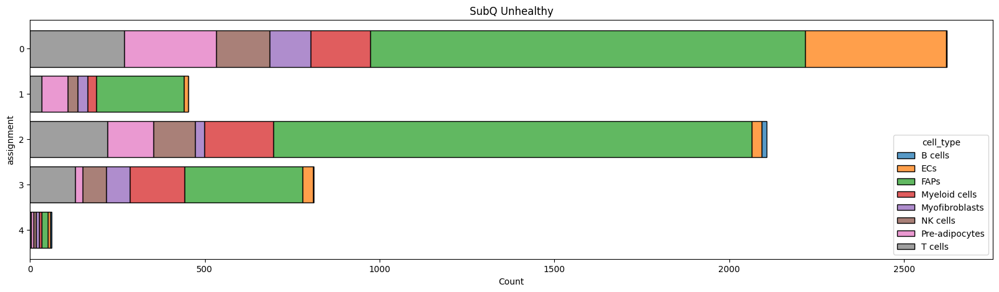

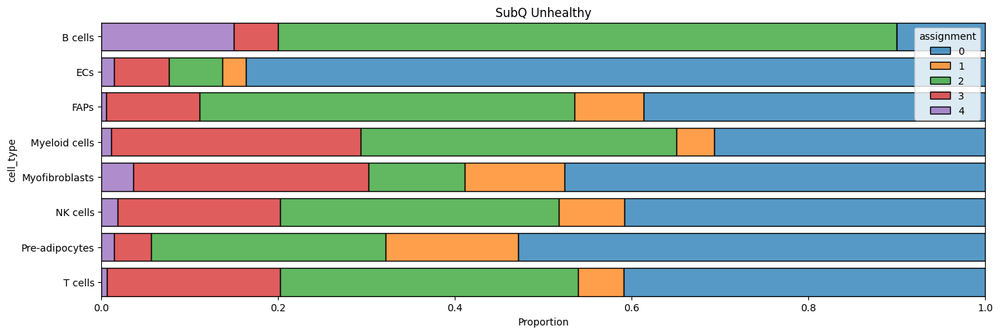

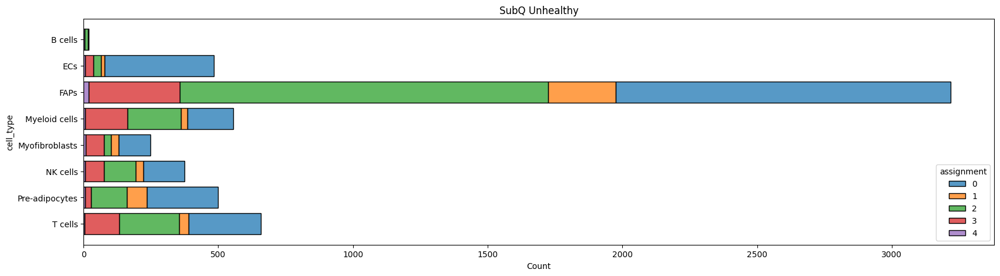

In [332]:
for disease in ["Healthy", "Unhealthy"]:
    
    adata = adata_all[adata_all.obs.disease == disease,:]
    title = f'{tissue} {disease}'
    
    fig, ax = plt.subplots(figsize=(16, 5))
    sns.histplot(
        data=adata.obs,
        y="assignment", hue="cell_type",
        multiple="fill", stat="proportion",
        discrete=True, shrink=.8, 
        ax=ax
    )
    ax.set_title(title)
    plt.show()

    fig, ax = plt.subplots(figsize=(20, 5))
    sns.histplot(
        data=adata.obs,
        y="assignment", hue="cell_type",
        multiple="stack", stat="count",
        discrete=True, shrink=.8,
        ax=ax
    )
    ax.set_title(title)
    plt.show()

    fig, ax = plt.subplots(figsize=(16, 5))
    sns.histplot(
        data=adata.obs,
        y="cell_type", hue="assignment",
        multiple="fill", stat="proportion",
        discrete=True, shrink=.8, 
        ax=ax
    )
    ax.set_title(title)
    plt.show()

    fig, ax = plt.subplots(figsize=(20, 5))
    sns.histplot(
        data=adata.obs,
        y="cell_type", hue="assignment",
        multiple="stack", stat="count",
        discrete=True, shrink=.8,
        ax=ax
    )
    ax.set_title(title)
    plt.show()

#### CD45+

In [339]:
adata_45 = adata_all[adata_all.obs.cd45 == "pos",:]
hue = "cell_type1"
tissue = "SubQ CD45+"

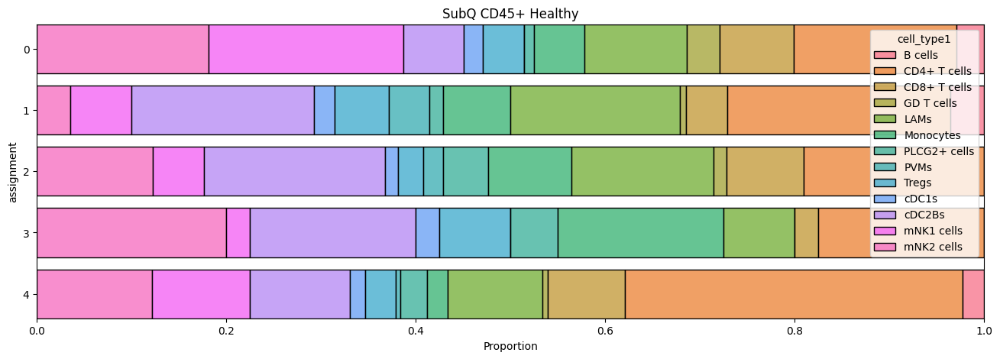

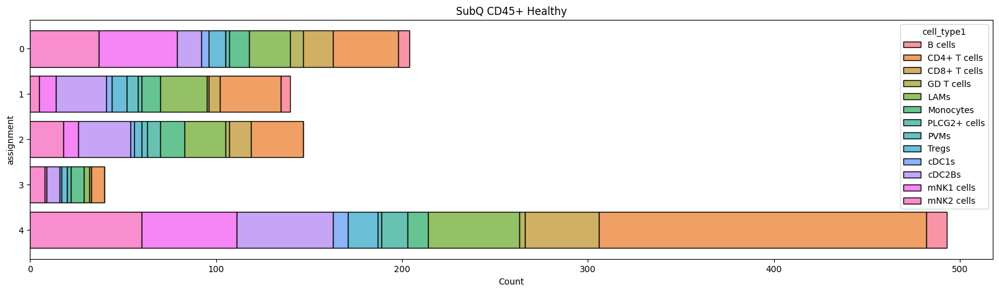

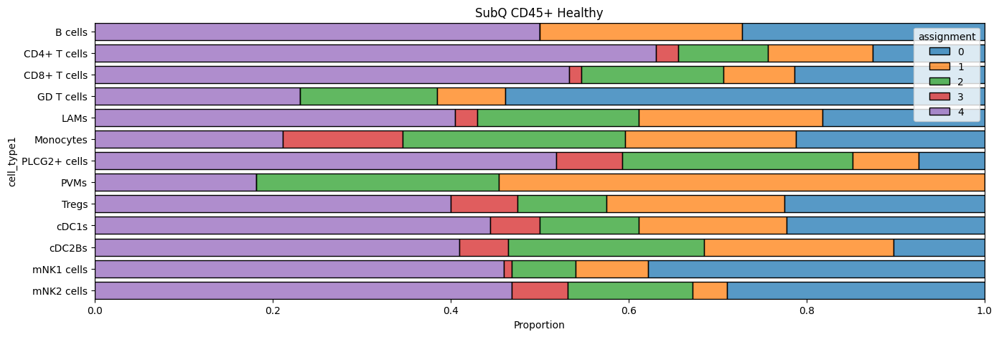

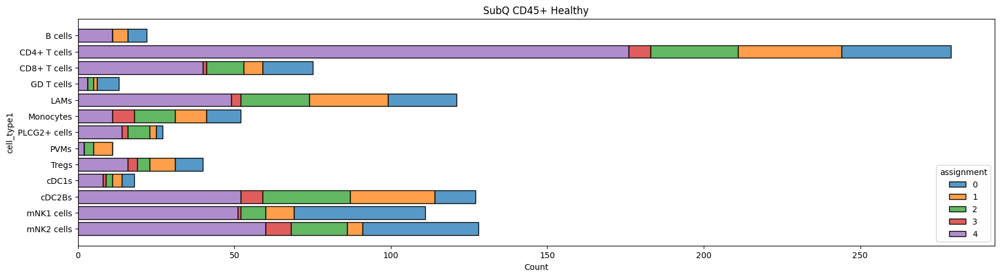

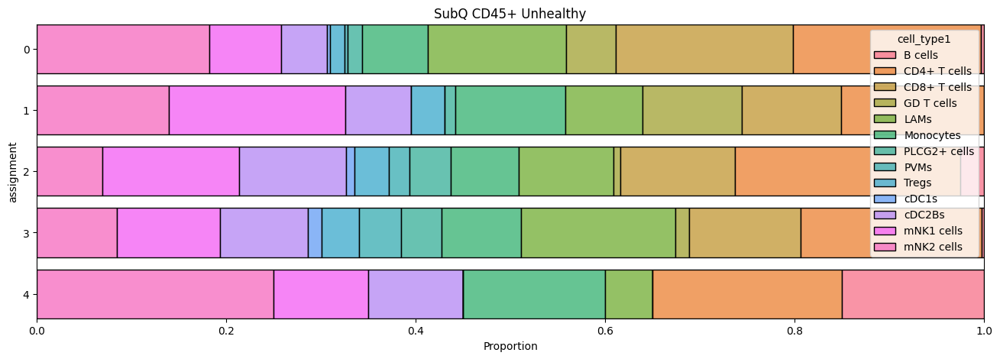

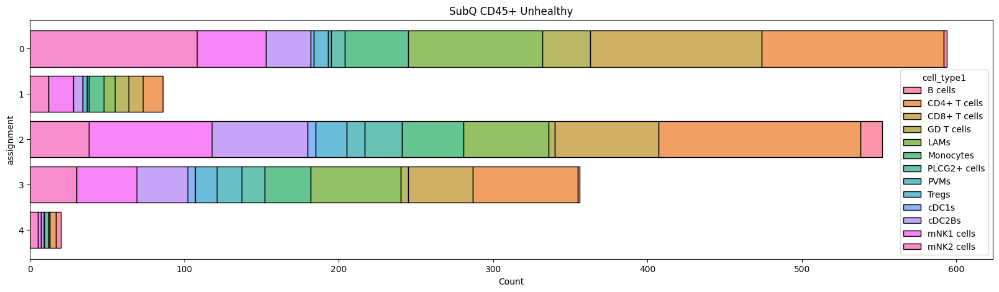

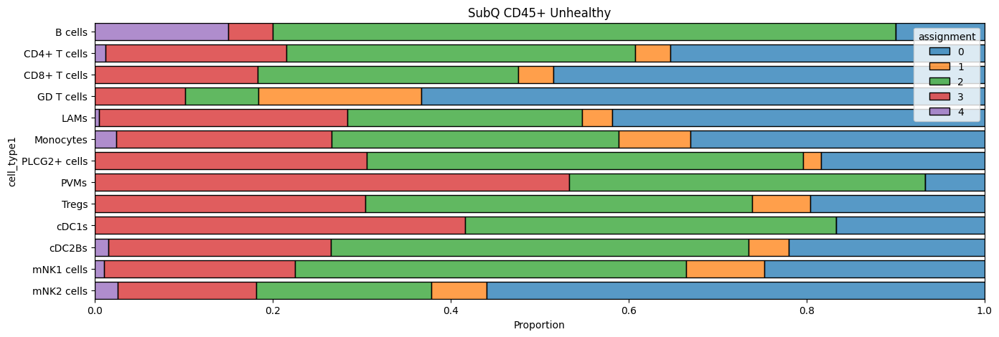

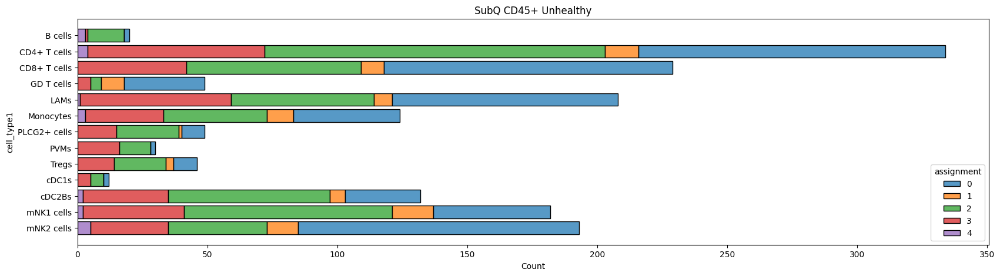

In [340]:
for disease in ["Healthy", "Unhealthy"]:
    
    adata = adata_45[adata_45.obs.disease == disease,:]
    title = f'{tissue} {disease}'
    
    fig, ax = plt.subplots(figsize=(16, 5))
    sns.histplot(
        data=adata.obs,
        y="assignment", hue=hue,
        multiple="fill", stat="proportion",
        discrete=True, shrink=.8, 
        ax=ax
    )
    ax.set_title(title)
    plt.show()

    fig, ax = plt.subplots(figsize=(20, 5))
    sns.histplot(
        data=adata.obs,
        y="assignment", hue=hue,
        multiple="stack", stat="count",
        discrete=True, shrink=.8,
        ax=ax
    )
    ax.set_title(title)
    plt.show()

    fig, ax = plt.subplots(figsize=(16, 5))
    sns.histplot(
        data=adata.obs,
        y=hue, hue="assignment",
        multiple="fill", stat="proportion",
        discrete=True, shrink=.8, 
        ax=ax
    )
    ax.set_title(title)
    plt.show()

    fig, ax = plt.subplots(figsize=(20, 5))
    sns.histplot(
        data=adata.obs,
        y=hue, hue="assignment",
        multiple="stack", stat="count",
        discrete=True, shrink=.8,
        ax=ax
    )
    ax.set_title(title)
    plt.show()

#### CD45-

In [337]:
adata_45_ = adata_all[adata_all.obs.cd45 == "neg",:]
hue = "cell_type1"
tissue = "SubQ CD45-"

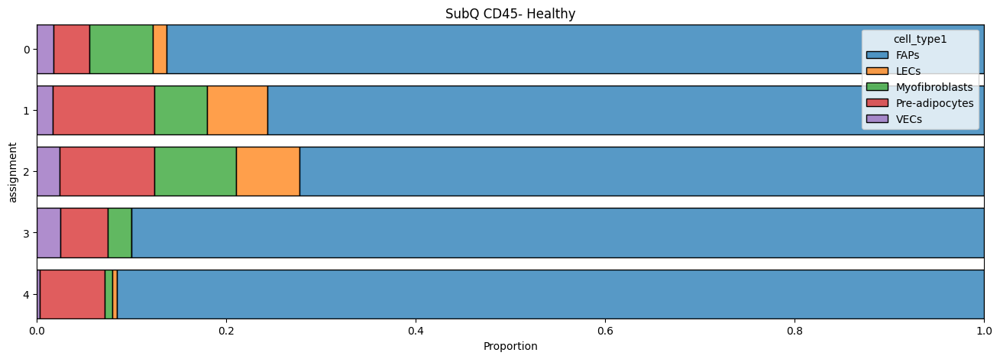

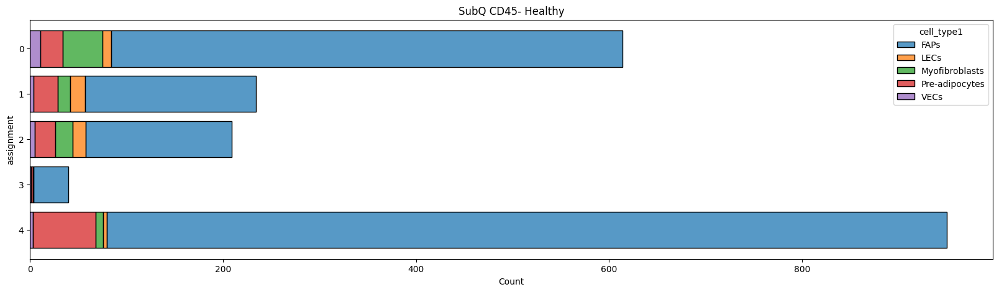

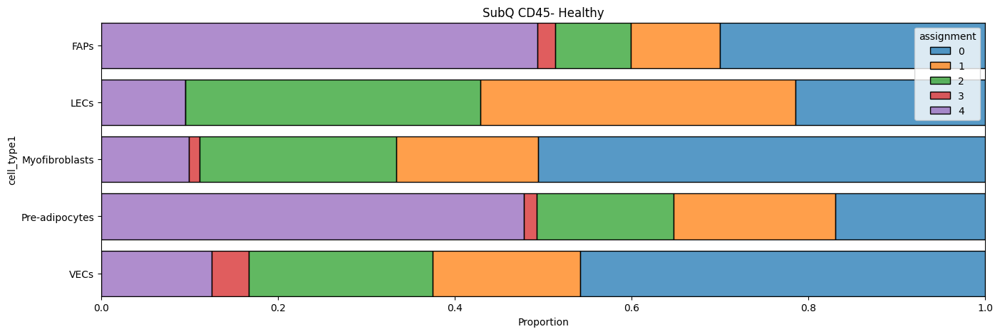

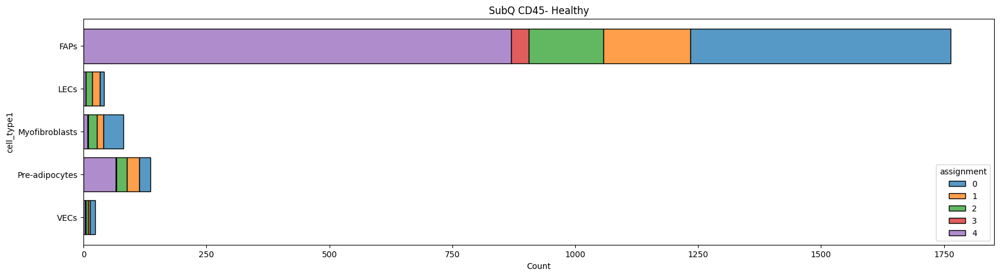

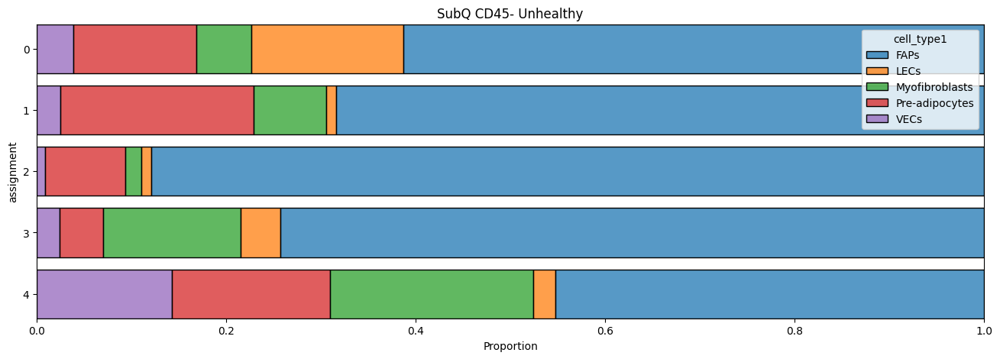

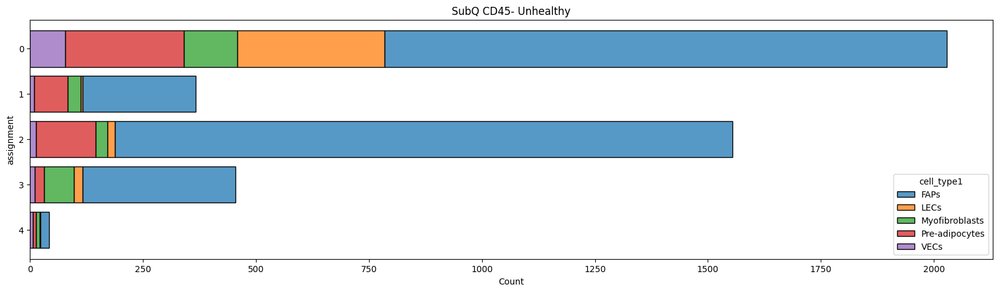

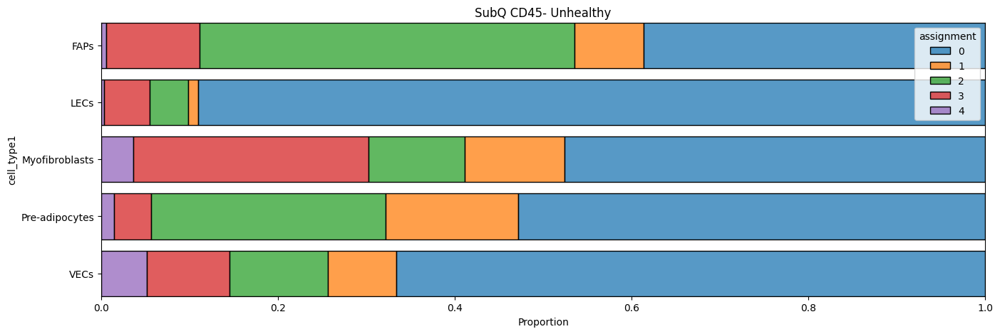

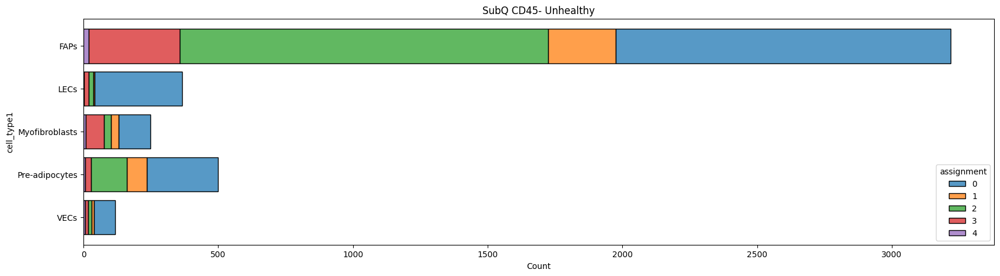

In [338]:
for disease in ["Healthy", "Unhealthy"]:
    
    adata = adata_45_[adata_45_.obs.disease == disease,:]
    title = f'{tissue} {disease}'
    
    fig, ax = plt.subplots(figsize=(16, 5))
    sns.histplot(
        data=adata.obs,
        y="assignment", hue=hue,
        multiple="fill", stat="proportion",
        discrete=True, shrink=.8, 
        ax=ax
    )
    ax.set_title(title)
    plt.show()

    fig, ax = plt.subplots(figsize=(20, 5))
    sns.histplot(
        data=adata.obs,
        y="assignment", hue=hue,
        multiple="stack", stat="count",
        discrete=True, shrink=.8,
        ax=ax
    )
    ax.set_title(title)
    plt.show()

    fig, ax = plt.subplots(figsize=(16, 5))
    sns.histplot(
        data=adata.obs,
        y=hue, hue="assignment",
        multiple="fill", stat="proportion",
        discrete=True, shrink=.8, 
        ax=ax
    )
    ax.set_title(title)
    plt.show()

    fig, ax = plt.subplots(figsize=(20, 5))
    sns.histplot(
        data=adata.obs,
        y=hue, hue="assignment",
        multiple="stack", stat="count",
        discrete=True, shrink=.8,
        ax=ax
    )
    ax.set_title(title)
    plt.show()